![title](qt=q_95.jpeg)

# Data Visualization Workshop

## By Xuechun

### Today's Topic:

1. Data Visualization Tools

2. Demo of creating maps using Python (folium, Plotly)

3. How to embed visuals on your website

## Some Data Visualization Tools

![title](visual_tools.png)

## Some other free tools
1. Openheatmap: http://www.openheatmap.com/
2. Flourish: https://flourish.studio/
3. D3.js Data-Driven : https://d3js.org (coding)

## Crime data Visualization Using python
**Python, Anaconda :**  
- **Python:**  https://docs.anaconda.com/anaconda/install/
- **Anaconda:**  is a package management and deployment tool for python and R.
- **Jupter notebook:** Jupyter supports over 40 programming languages, including Python, R, Julia, and Scala. https://jupyter.org/install

**Packages used:**  
Install packages in python : https://packaging.python.org/tutorials/installing-packages/

pandas, geopandas
- **folium:** https://python-visualization.github.io/folium/quickstart.html#Getting-Started
- **plotly:** https://plotly.com/python/getting-started/

**Data Source: **
- **Neighborhood regions data:** https://public.opendatasoft.com/explore/dataset/zillow-neighborhoods/export/?q=DC&refine.state=DC
- **DC crime data 2019:**  https://opendata.dc.gov/datasets/crime-incidents-in-2019

**Online Courses:**
- Data Visualization with Python(coursera): https://www.coursera.org/learn/python-for-data-visualization
- Data Visualization with Python(Datacamp): https://www.datacamp.com/tracks/data-visualization-with-python

# Work Demos

In [1]:
## Import required packages
import pandas as pd
import geopandas as gpd
import folium
from folium import plugins
import branca
import time
start_time = time.time()

In [2]:
## Load geojson as geopandas dataframe
dc_zil_gdf = gpd.read_file("zillow-neighborhoods.geojson")    
dc_zil_gdf.head()

,city,name,regionid,county,state,geometry
0,Washington,Catholic University,273159,District of Columbia,DC,"POLYGON ((-77.00433 38.94064, -77.00423 38.940..."
1,Washington,McLean Gardens,121759,District of Columbia,DC,"POLYGON ((-77.07520 38.93977, -77.07475 38.938..."
2,Washington,Lincoln Heights,121751,District of Columbia,DC,"POLYGON ((-76.92405 38.89835, -76.92303 38.898..."
3,Washington,Kenilworth,121743,District of Columbia,DC,"POLYGON ((-76.93406 38.91220, -76.93426 38.911..."
4,Washington,Bellevue,121674,District of Columbia,DC,"POLYGON ((-77.01639 38.80932, -77.01753 38.808..."


In [6]:
dc_zil_gdf.shape

(137, 6)

In [29]:
dc_crime_2019 = pd.read_csv('Crime_Incidents_in_2019.csv')

In [10]:
dc_crime_2019.columns

Index(['X', 'Y', 'CCN', 'REPORT_DAT', 'SHIFT', 'METHOD', 'OFFENSE', 'BLOCK',
       'XBLOCK', 'YBLOCK', 'WARD', 'ANC', 'DISTRICT', 'PSA',
       'NEIGHBORHOOD_CLUSTER', 'BLOCK_GROUP', 'CENSUS_TRACT',
       'VOTING_PRECINCT', 'LATITUDE', 'LONGITUDE', 'BID', 'START_DATE',
       'END_DATE', 'OBJECTID', 'OCTO_RECORD_ID'],
      dtype='object')

In [32]:
dc_crime_2019.head()

,X,Y,CCN,REPORT_DAT,SHIFT,METHOD,OFFENSE,BLOCK,XBLOCK,YBLOCK,...,BLOCK_GROUP,CENSUS_TRACT,VOTING_PRECINCT,LATITUDE,LONGITUDE,BID,START_DATE,END_DATE,OBJECTID,OCTO_RECORD_ID
0,-76.982944,38.887599,10199597,2019-11-07T11:41:36.000Z,DAY,OTHERS,THEFT/OTHER,1500 - 1599 BLOCK OF INDEPENDENCE AVENUE SE,401480.0,135528.0,...,006801 2,6801.0,Precinct 87,38.887592,-76.982941,NaN,2019-11-07T10:36:52.000Z,2019-11-07T11:42:02.000Z,429611163,10199597-01
1,-77.010378,38.820469,17084415,2019-01-28T00:00:00.000Z,MIDNIGHT,GUN,HOMICIDE,130 - 199 BLOCK OF IRVINGTON STREET SW,399099.0,128076.0,...,010900 2,10900.0,Precinct 126,38.820461,-77.010375,NaN,2017-05-19T22:58:53.000Z,2017-05-20T02:26:45.000Z,429841378,17084415-01
2,-76.952665,38.920544,18208996,2019-03-22T16:18:15.000Z,EVENING,OTHERS,THEFT/OTHER,2400 BLOCK OF MARKET STREET NE,404105.0,139186.0,...,009000 1,9000.0,Precinct 139,38.920536,-76.952663,NaN,2018-12-09T17:01:49.000Z,2018-12-09T18:49:21.000Z,429890611,18208996-01
3,-77.027565,38.897353,18221681,2019-01-01T10:24:06.000Z,DAY,OTHERS,THEFT/OTHER,1100 - 1199 BLOCK OF F STREET NW,397609.0,136611.0,...,005800 1,5800.0,Precinct 129,38.897346,-77.027563,DOWNTOWN,2018-12-31T11:49:19.000Z,2018-12-31T14:43:21.000Z,429890721,18221681-01
4,-77.021929,38.899129,18221708,2019-01-01T15:48:01.000Z,EVENING,OTHERS,THEFT/OTHER,700 - 799 BLOCK OF 7TH STREET NW,398098.0,136808.0,...,005800 1,5800.0,Precinct 129,38.899121,-77.021926,DOWNTOWN,2018-12-31T12:48:46.000Z,2018-12-31T12:51:47.000Z,429890728,18221708-01


In [31]:
dc_crime_2019['NEIGHBORHOOD_CLUSTER']

0        Cluster 26
1        Cluster 39
2        Cluster 24
3         Cluster 8
4         Cluster 8
            ...    
33905    Cluster 25
33906    Cluster 33
33907    Cluster 33
33908    Cluster 25
33909    Cluster 25
Name: NEIGHBORHOOD_CLUSTER, Length: 33910, dtype: object

In [18]:
dc_zil_gdf.columns

Index(['city', 'name', 'regionid', 'county', 'state', 'geometry'], dtype='object')

## Encode Neighborhood

In [3]:
import pyproj
from shapely.geometry import shape, Point
from shapely.ops import transform
from functools import partial

In [23]:
dc_crime_2019['neighborhood'] = ""
long = dc_crime_2019.columns.get_loc('LONGITUDE')
lat = dc_crime_2019.columns.get_loc('LATITUDE')
geometry = dc_zil_gdf.columns.get_loc('geometry')
name = dc_zil_gdf.columns.get_loc('name')

## use shapely to check if lat/lon is within the zillow neighborhood shape
for i in range(len(dc_crime_2019)):
    point = Point(dc_crime_2019.iloc[i,long],dc_crime_2019.iloc[i,lat]) ## Longitude, Latitude

    for j in range(len(dc_zil_gdf)):
        polygon = shape(dc_zil_gdf.iloc[j,geometry])
        if polygon.contains(point):
            dc_crime_2019.iloc[i, dc_crime_2019.columns.get_loc('neighborhood')] = dc_zil_gdf.iloc[j,name]
            
dc_crime_2019.to_csv("dc_crime_2019_final.csv", index = False) ## write the data so we don't have to re-run this every time
        
dc_crime_2019.head()


,X,Y,CCN,REPORT_DAT,SHIFT,METHOD,OFFENSE,BLOCK,XBLOCK,YBLOCK,...,CENSUS_TRACT,VOTING_PRECINCT,LATITUDE,LONGITUDE,BID,START_DATE,END_DATE,OBJECTID,OCTO_RECORD_ID,neighborhood
0,-76.982944,38.887599,10199597,2019-11-07T11:41:36.000Z,DAY,OTHERS,THEFT/OTHER,1500 - 1599 BLOCK OF INDEPENDENCE AVENUE SE,401480.0,135528.0,...,6801.0,Precinct 87,38.887592,-76.982941,NaN,2019-11-07T10:36:52.000Z,2019-11-07T11:42:02.000Z,429611163,10199597-01,Kingman Park
1,-77.010378,38.820469,17084415,2019-01-28T00:00:00.000Z,MIDNIGHT,GUN,HOMICIDE,130 - 199 BLOCK OF IRVINGTON STREET SW,399099.0,128076.0,...,10900.0,Precinct 126,38.820461,-77.010375,NaN,2017-05-19T22:58:53.000Z,2017-05-20T02:26:45.000Z,429841378,17084415-01,Bellevue
2,-76.952665,38.920544,18208996,2019-03-22T16:18:15.000Z,EVENING,OTHERS,THEFT/OTHER,2400 BLOCK OF MARKET STREET NE,404105.0,139186.0,...,9000.0,Precinct 139,38.920536,-76.952663,NaN,2018-12-09T17:01:49.000Z,2018-12-09T18:49:21.000Z,429890611,18208996-01,Fort Lincoln
3,-77.027565,38.897353,18221681,2019-01-01T10:24:06.000Z,DAY,OTHERS,THEFT/OTHER,1100 - 1199 BLOCK OF F STREET NW,397609.0,136611.0,...,5800.0,Precinct 129,38.897346,-77.027563,DOWNTOWN,2018-12-31T11:49:19.000Z,2018-12-31T14:43:21.000Z,429890721,18221681-01,Penn Quarter
4,-77.021929,38.899129,18221708,2019-01-01T15:48:01.000Z,EVENING,OTHERS,THEFT/OTHER,700 - 799 BLOCK OF 7TH STREET NW,398098.0,136808.0,...,5800.0,Precinct 129,38.899121,-77.021926,DOWNTOWN,2018-12-31T12:48:46.000Z,2018-12-31T12:51:47.000Z,429890728,18221708-01,Chinatown


In [4]:
dc_crime_2019 = pd.read_csv("dc_crime_2019_final.csv")

In [5]:
nhood_incidents_all = dc_crime_2019.neighborhood.value_counts()
nhood_map = dc_zil_gdf.merge(nhood_incidents_all.to_frame('Incidents_All'), left_on = 'name',right_index = True)
nhood_map.head()

,city,name,regionid,county,state,geometry,Incidents_All
0,Washington,Catholic University,273159,District of Columbia,DC,"POLYGON ((-77.00433 38.94064, -77.00423 38.940...",130
1,Washington,McLean Gardens,121759,District of Columbia,DC,"POLYGON ((-77.07520 38.93977, -77.07475 38.938...",19
2,Washington,Lincoln Heights,121751,District of Columbia,DC,"POLYGON ((-76.92405 38.89835, -76.92303 38.898...",66
3,Washington,Kenilworth,121743,District of Columbia,DC,"POLYGON ((-76.93406 38.91220, -76.93426 38.911...",47
4,Washington,Bellevue,121674,District of Columbia,DC,"POLYGON ((-77.01639 38.80932, -77.01753 38.808...",206


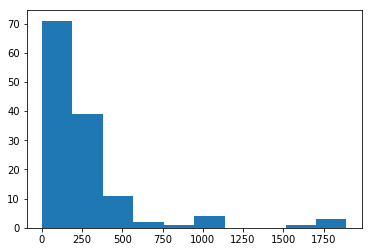

In [7]:
nhood_map['Incidents_All'].max()
import matplotlib.pyplot as plt
plt.hist(nhood_map['Incidents_All'], bins=10)
plt.show()

In [35]:
max(nhood_map['Incidents_All'])

1892

## Create a Crime Heatmap Using Python Folium

In [33]:
## identifies the center point of all the neighborhood shapes 
centroid=dc_zil_gdf.geometry.centroid 
## initiaes a map based on the centroid
m=folium.Map(location=[centroid.y.mean(), centroid.x.mean()], zoom_start=12) 

In [34]:
m

In [14]:
nhood_map['QP'] = nhood_map['Incidents_All'] / nhood_map['Incidents_All'].sum()
nhood_map['QP_str'] = nhood_map['QP'].apply(lambda x : str(round(x*100, 1)) + '%')

name = "DC Crime Map"
leg_brks = [0, 50.0, 150.0, 250.0,500,750.0, 1000.0, 1892.0]
colorscale = branca.colormap.linear.YlOrRd_09.scale(nhood_map['Incidents_All'].min(), nhood_map['Incidents_All'].max()) 
colorscale = colorscale.to_step(n = 7, quantiles = leg_brks) ## sets quantile breaks 
colorscale.caption = name ## adds name for legend
colorscale


In [37]:
centroid=dc_zil_gdf.geometry.centroid 
## initiaes a map based on the centroid
m=folium.Map(location=[centroid.y.mean(), centroid.x.mean()], tiles="Stamen Toner", zoom_start=12) 
m

In [38]:
# nhood_map['QP'] = nhood_map['Incidents_All'] / nhood_map['Incidents_All'].sum()
# nhood_map['QP_str'] = nhood_map['QP'].apply(lambda x : str(round(x*100, 1)) + '%')

# from branca.colormap import linear
# nbh_count_colormap = linear.YlGnBu_09.scale(min(nhood_map['Incidents_All']),
#                                             max(nhood_map['Incidents_All']))

## identifies the center point of all the neighborhood shapes 
centroid=dc_zil_gdf.geometry.centroid 
## initiaes a map based on the centroid
m=folium.Map(location=[centroid.y.mean(), centroid.x.mean()], tiles="Stamen Toner", zoom_start=12) 
style_function = lambda x: {"weight":1
                             , 'color': '#545453'
                             ## if variable is 0 map is a very light grey
                             ## else colorscale applies based on variable
                             , 'fillColor':'#9B9B9B' if x['properties']['Incidents_All'] == 0 
                             else colorscale(x['properties']['Incidents_All'])
                             ## similarly opacity is increased if value is 0
                             , 'fillOpacity': 0.2 if x['properties']['Incidents_All'] == 0 
                             else 0.7}


folium.GeoJson(
    nhood_map,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['name', 'Incidents_All', 'QP_str'],
        aliases=['Neighbourhood', 'Incidents amount', 'Quote-part'],
        localize=True
    )
).add_to(m)

colorscale.add_to(m)
colorscale.caption = 'DC Crime Map 2019'
colorscale.add_to(m)
m

In [39]:
m.save('dc_crime.html')

In [40]:
nhood_map['QP'] = nhood_map['Incidents_All'] / nhood_map['Incidents_All'].sum()
nhood_map['QP_str'] = nhood_map['QP'].apply(lambda x : str(round(x*100, 1)) + '%')

from branca.colormap import linear
nbh_count_colormap = linear.YlGnBu_09.scale(min(nhood_map['Incidents_All']),
                                            max(nhood_map['Incidents_All']))
nbh_count_colormap

In [41]:
## identifies the center point of all the neighborhood shapes 
centroid=dc_zil_gdf.geometry.centroid 
## initiaes a map based on the centroid
m=folium.Map(location=[centroid.y.mean(), centroid.x.mean()], tiles="Stamen Toner", zoom_start=12) 
style_function = lambda x: {
    'fillColor': nbh_count_colormap(x['properties']['Incidents_All']),
    'color': 'black',
    'weight': 1.5,
    'fillOpacity': 0.7
}

folium.GeoJson(
    nhood_map,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['name', 'Incidents_All', 'QP_str'],
        aliases=['Neighbourhood', 'Incidents amount', 'Quote-part'],
        localize=True
    )
).add_to(m)

nbh_count_colormap.add_to(m)
nbh_count_colormap.caption = 'DC Crime Map 2019'
nbh_count_colormap.add_to(m)
m

## Create a Crime map Using Python Plotly

In [107]:
dc_crime_2019.head()

,X,Y,CCN,REPORT_DAT,SHIFT,METHOD,OFFENSE,BLOCK,XBLOCK,YBLOCK,...,CENSUS_TRACT,VOTING_PRECINCT,LATITUDE,LONGITUDE,BID,START_DATE,END_DATE,OBJECTID,OCTO_RECORD_ID,neighborhood
0,-76.982944,38.887599,10199597,2019-11-07T11:41:36.000Z,DAY,OTHERS,THEFT/OTHER,1500 - 1599 BLOCK OF INDEPENDENCE AVENUE SE,401480.0,135528.0,...,6801.0,Precinct 87,38.887592,-76.982941,NaN,2019-11-07T10:36:52.000Z,2019-11-07T11:42:02.000Z,429611163,10199597-01,Kingman Park
1,-77.010378,38.820469,17084415,2019-01-28T00:00:00.000Z,MIDNIGHT,GUN,HOMICIDE,130 - 199 BLOCK OF IRVINGTON STREET SW,399099.0,128076.0,...,10900.0,Precinct 126,38.820461,-77.010375,NaN,2017-05-19T22:58:53.000Z,2017-05-20T02:26:45.000Z,429841378,17084415-01,Bellevue
2,-76.952665,38.920544,18208996,2019-03-22T16:18:15.000Z,EVENING,OTHERS,THEFT/OTHER,2400 BLOCK OF MARKET STREET NE,404105.0,139186.0,...,9000.0,Precinct 139,38.920536,-76.952663,NaN,2018-12-09T17:01:49.000Z,2018-12-09T18:49:21.000Z,429890611,18208996-01,Fort Lincoln
3,-77.027565,38.897353,18221681,2019-01-01T10:24:06.000Z,DAY,OTHERS,THEFT/OTHER,1100 - 1199 BLOCK OF F STREET NW,397609.0,136611.0,...,5800.0,Precinct 129,38.897346,-77.027563,DOWNTOWN,2018-12-31T11:49:19.000Z,2018-12-31T14:43:21.000Z,429890721,18221681-01,Penn Quarter
4,-77.021929,38.899129,18221708,2019-01-01T15:48:01.000Z,EVENING,OTHERS,THEFT/OTHER,700 - 799 BLOCK OF 7TH STREET NW,398098.0,136808.0,...,5800.0,Precinct 129,38.899121,-77.021926,DOWNTOWN,2018-12-31T12:48:46.000Z,2018-12-31T12:51:47.000Z,429890728,18221708-01,Chinatown


In [19]:
ave_lat = sum(dc_crime_2019.Y)/len(dc_crime_2019.Y)
ave_long = sum(dc_crime_2019.X)/len(dc_crime_2019.X)

In [20]:
ave_lat

38.908362901861594

In [21]:
import plotly
import plotly.graph_objs as go
from plotly.tools import make_subplots

# Generate an access token for this project 
mapbox_access_token = 'pk.eyJ1Ijoid2FuZzY1MDYiLCJhIjoiY2tiNGtra2ozMHVoYjJ3bzlsMThtenNyOCJ9.jPlsp6JCn_Vu_GzykjHtnw'
my_style = "mapbox://styles/wang6506/ckb4kl37t0q271jmpxc8akwsg"

trace = go.Scattermapbox(
  lat = dc_crime_2019['Y'],
  lon = dc_crime_2019['X'],
  marker = go.scattermapbox.Marker(size = 5,opacity = 0.7),
  text = dc_crime_2019[['BLOCK','OFFENSE']]
)

layout = go.Layout(
     title = 'DC Crime Visual',
     width = 1000, height = 1000,
     mapbox = go.layout.Mapbox(
       accesstoken = mapbox_access_token,
       bearing = -50,
       pitch  = 50,
       zoom = 12,
       center = go.layout.mapbox.Center(lat=ave_lat,lon=ave_long),
       style = my_style
     ),
 )
fig = go.Figure(data = trace, layout = layout)
plotly.offline.iplot(fig)

## Focus on One Hotsopt

In [26]:
import folium.plugins
from folium.plugins import MarkerCluster
mydata = dc_crime_2019[dc_crime_2019.NEIGHBORHOOD_CLUSTER == "Cluster 39"]
ave_lat = sum(mydata.Y)/len(mydata.Y)
ave_long = sum(mydata.X)/len(mydata.X)
my_map = folium.Map(location=[ave_lat,ave_long],
                        zoom_start=14,
                        tiles="OpenStreetMap")
marker_cluster = MarkerCluster().add_to(my_map)

In [23]:
import warnings
warnings.filterwarnings("ignore")

color_list = []
for i in range(len(mydata['LATITUDE'])):   
    if mydata.iloc[i][6] == "THEFT/OTHER":
        color = "orange"
    elif mydata.iloc[i][6] == "THEFT F/AUTO":
        color = "purple"
    elif mydata.iloc[i][6] == "MOTOR VEHICLE THEFT":
        color = "green"
    elif mydata.iloc[i][6] == "ASSAULT W/DANGEROUS WEAPON":
        color = "darkred"
    elif mydata.iloc[i][6] == "HOMICIDE":
        color = "red"
    elif mydata.iloc[i][6] == "BURGLARY":
        color = "gray"
    elif mydata.iloc[i][6] == "ROBBERY":
        color = "darkpurple"
    elif mydata.iloc[i][6] == "SEX ABUSE":
        color = "darkblue"
    else:
        color = "black"
    color_list.append(color)
mydata['color'] = pd.Series(color_list).values

In [27]:
for i in range(len(mydata['LATITUDE'])):
    lat = mydata.iloc[i][18]
    long = mydata.iloc[i][19]
    color = mydata.iloc[i][25]
    popup_text = """ OFFENSE : {}<br>
                METHOD : {}<br>
                BLOCK_GROUP : {}<br>
                SHIFT : {}<br>
                START DATE : {}<br>""" 
        
    popup_text = popup_text.format(mydata.iloc[i][6],
                                mydata.iloc[i][5],
                                mydata.iloc[i][15],
                                mydata.iloc[i][4],  
                                mydata.iloc[i][21]
                               )
    folium.Marker(location = [lat, long], popup= folium.Popup(popup_text, max_width=400), icon=folium.Icon(color=color, icon_color='white', icon='exclamation-triangle', prefix='fa')).add_to(marker_cluster)
    

In [28]:
from branca.element import Template, MacroElement
template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend (draggable!)</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:orange;opacity:0.7;'></span>THEFT/OTHER - 314</li>
    <li><span style='background:purple;opacity:0.7;'></span>THEFT F/AUTO - 199</li>
    <li><span style='background:green;opacity:0.7;'></span>MOTOR VEHICLE THEFT - 118</li>
    <li><span style='background:darkred;opacity:0.7;'></span>ASSAULT W/DANGEROUS WEAPON - 132</li>
    <li><span style='background:red;opacity:0.7;'></span>HOMICIDE - 32</li>
    <li><span style='background:gray;opacity:0.7;'></span>BURGLARY - 76</li>
    <li><span style='background:#3f1b45;opacity:0.7;'></span>ROBBERY - 126</li>
    <li><span style='background:darkblue;opacity:0.7;'></span>SEX ABUSE - 23</li>
    <li><span style='background:green;black:0.7;'></span>OTHERS - 1</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)
my_map.get_root().add_child(macro)